In [1]:
import json
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
from scripts.processing import process_datasets, load_datasets
from scripts.scorer import scorer, simulate_scorer
from scripts.charts import *

process_datasets(
    ballots_csv_path='data/_local/rf6_votes.csv',
    voters_csv_path='data/_local/rf6_voters.csv',
    projects_csv_path='data/_local/rf6_projects.csv',
    output_dir='data/_local/clean'
)

voting_data, df_all_votes, df_voters, df_projects = load_datasets('data/_local/clean')

Voters dataframe length: 178
Actual voters length: 138
Voters dataframe length after filtering: 138
Processing complete.


In [3]:
df = (
    df_all_votes
    .merge(df_projects, on='project_id')
    .merge(df_voters.drop(columns=['category']), on='voter_address')
)
len(df)

4170

# Part 1. High level observations

Text(0.0, 1.0, 'How big should the round be?\n')

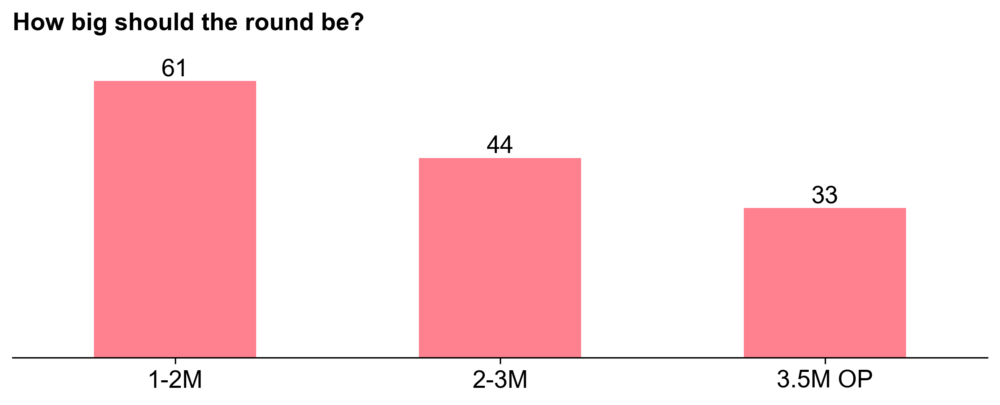

In [4]:
budgets = pd.Series([x['budget'] for x in voting_data])

bins = [0, 1_000_000, 2_000_000, 3_499_000, float('inf')]
labels = ['<1M', '1-2M', '2-3M', '3.5M OP']

budget_categories = pd.cut(budgets, bins=bins, labels=labels)
crosstab_budget = pd.crosstab(budget_categories, columns="count")

fig, ax = get_plot(crosstab_budget, kind='bar', color='#ff0420', alpha=.5)

ax.legend().remove()
ax.tick_params(axis='x', rotation=0)
ax.set_xlabel("")

ax.set_ylabel("")
ax.spines['left'].set_visible(False)
ax.set_yticks([])

for bars in ax.containers:
    labels = [f'{int(v)}' if v > 0 else '' for v in bars.datavalues]
    ax.bar_label(bars, labels=labels, label_type='edge')

ax.set_title(f"How big should the round be?\n", loc='left', weight='bold')

Text(0.0, 1.0, 'Composition of RF6 voters\n')

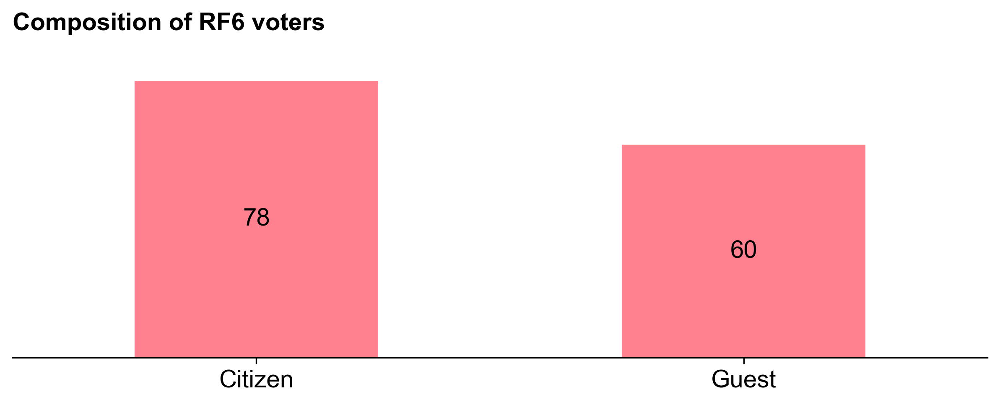

In [5]:
fig, ax = get_plot(
    df_voters.voter_type.value_counts(),
    kind='bar',
    color='#ff0420',
    alpha=.5
)
ax.tick_params(axis='x', rotation=0)
ax.set_xlabel("")

ax.set_ylabel("")
ax.spines['left'].set_visible(False)
ax.set_yticks([])

for bars in ax.containers:
    labels = [f'{int(v)}' if v > 0 else '' for v in bars.datavalues]
    ax.bar_label(bars, labels=labels, label_type='center')

ax.set_title(f"Composition of RF6 voters\n", loc='left', weight='bold')

In [6]:
print("Conflicts of interest:", len(df_all_votes[df_all_votes['project_percentage'].isna()==True]))
print("Total votes:", len(df_all_votes))

Conflicts of interest: 79
Total votes: 4170


# Part 2. Comparing distribution curves


Median Budget: 2,400,000

Category: GOVERNANCE_INFRA_AND_TOOLING
-----------------
Median Allocation: 41.891%

Category: GOVERNANCE_LEADERSHIP
-----------------
Median Allocation: 27.961%

Category: GOVERNANCE_ANALYTICS
-----------------
Median Allocation: 30.149%
Max: 87994.93949589222
Share to max: 0.03666455812328843
Min: 4641.084905930694


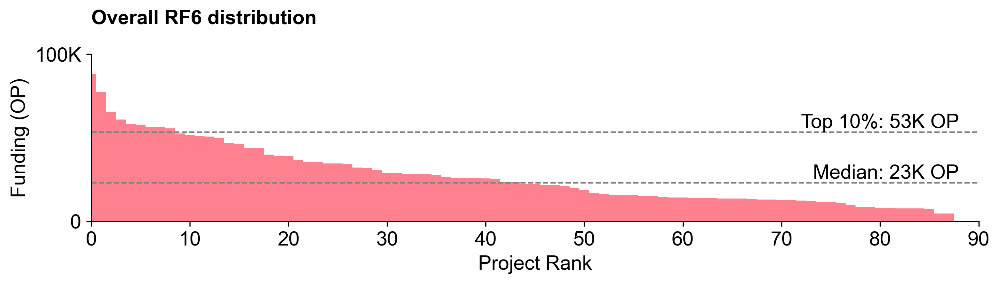

In [7]:
r6_data = scorer(voting_data)['rewards']
r6_dist = distributions_barchart(
    r6_data,
    title='Overall RF6 distribution',
    ymax=100,
    xstep=10
)

print("Max:", r6_data.max())
print("Share to max:", r6_data.max() / r6_data.sum())
print("Min:", r6_data.min())

# Part 3. Deep dive on ballot variance

In [8]:
projects_in_category_count = df_projects.reset_index().groupby('category')['project_id'].nunique().to_dict()
voter_categories = df_voters.reset_index().groupby('category')['voter_address'].agg(list).to_dict()
vote_patterns = []
for category, voter_list in voter_categories.items():
    num_projects = projects_in_category_count[category]
    for voter in voter_list:
        dff = df_all_votes[df_all_votes['voter_address'] == voter]
        num_cois = len(dff[dff['project_percentage'].isna()])
        vote_patterns.append({
            'voter_address': voter,
            'category': category,
            'had_coi': num_cois,
            'supported_all_projects': (len(dff[dff['project_percentage'] > 0]) + num_cois) == num_projects,
            'gave_over_5K_to_all': (len(dff[dff['project_amount'] > 5_000]) + num_cois) == num_projects,
            'gave_more_than_125_to_any': len(dff[dff['project_percentage'] > .125]) > 0
        })
        
df_voter_patterns = pd.DataFrame(vote_patterns)
print(df_voter_patterns['supported_all_projects'].mean())
print(df_voter_patterns['gave_over_5K_to_all'].mean())
print(df_voter_patterns['gave_more_than_125_to_any'].mean())

0.12318840579710146
0.057971014492753624
0.5144927536231884


In [9]:
df_voters['variance'] = (
    df.groupby('voter_address')['project_percentage'].std()
    / df.groupby('voter_address')['project_percentage'].mean()
)

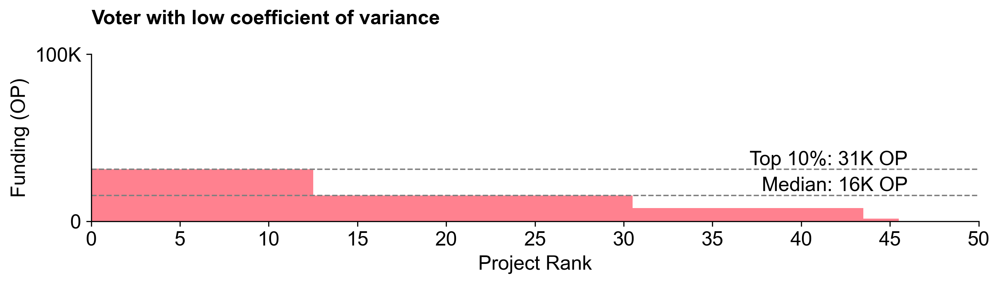

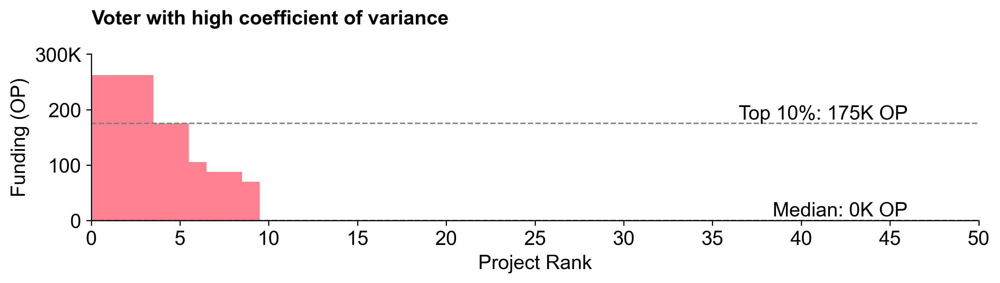

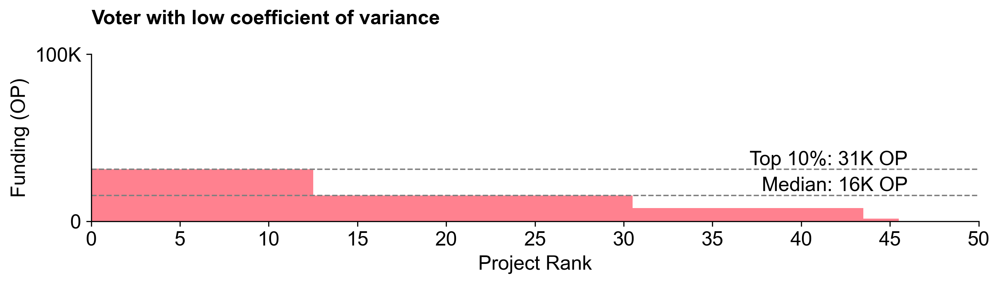

In [10]:
high_cv_voter = df_voters['variance'].sort_values().index[-5]
distributions_barchart(
    df_all_votes[df_all_votes.voter_address == high_cv_voter]['project_amount'],
    title='Voter with high coefficient of variance',
    xstep=5,
    ymax=300
)

low_cv_voter = df_voters['variance'].sort_values().index[3]
distributions_barchart(
    df_all_votes[df_all_votes.voter_address == low_cv_voter]['project_amount'],
    title='Voter with low coefficient of variance',
    xstep=5,
    ymax=100
)

## Facet Grid: All voters

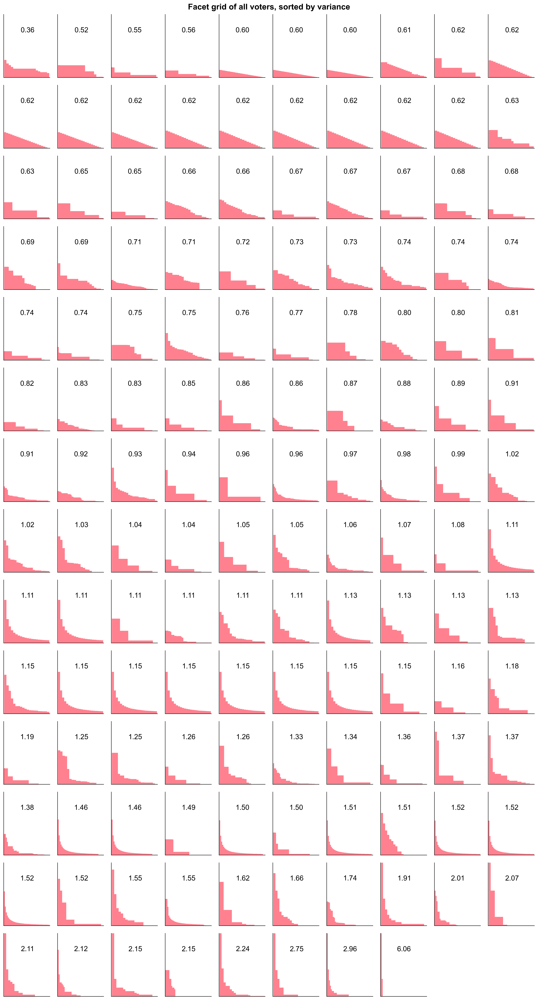

In [11]:
def plot_hist(series, color, ax):
    s = series.sort_values(ascending=False)
    s.plot(kind='bar', color=color, ax=ax, alpha=.5, width=1)
    ax.set_ylim(0,.36)
    ax.set_xticks([])
    ax.set_yticks([])

nrows = int(np.ceil(len(df_voters) / 10))
fig, axes = plt.subplots(figsize=(15,nrows*2), nrows=nrows, ncols=10, dpi=300)

for i,(addr,row) in enumerate(df_voters.sort_values(by='variance').iterrows()):
    ax = axes[i//10, i%10]
    color = '#ff0420'
    series = df[df['voter_address'] == addr]['project_percentage']
    plot_hist(series, color, ax)
    x1, x2 = ax.get_xlim()
    y1, y2 = ax.get_ylim()
    ax.text(x2/2, y2*.8, f"{row['variance']:.2f}", ha='center', va='top')
    
total_plots = len(df_voters)
total_subplots = nrows * 10
unused = total_subplots - total_plots
if unused > 0:
    for i in range(total_plots, total_subplots):
        ax = axes[i // 10, i % 10]
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_visible(False)    
    
fig.suptitle("Facet grid of all voters, sorted by variance\n", weight='bold')    
fig.tight_layout()

## Facet Grid: By Citizenship

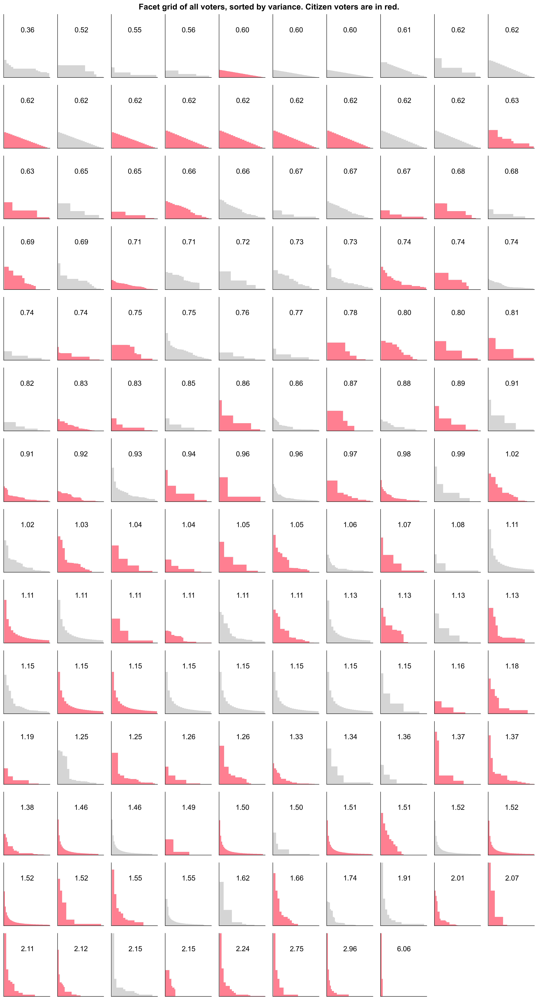

In [12]:
def plot_hist(series, color, ax):
    s = series.sort_values(ascending=False)
    s.plot(kind='bar', color=color, ax=ax, alpha=.5, width=1)
    ax.set_ylim(0,.36)
    ax.set_xticks([])
    ax.set_yticks([])
    
nrows = int(np.ceil(len(df_voters) / 10))
fig, axes = plt.subplots(figsize=(15,nrows*2), nrows=nrows, ncols=10, dpi=300)

for i,(addr,row) in enumerate(df_voters.sort_values(by='variance').iterrows()):
    ax = axes[i//10, i%10]
    color = '#ff0420' if row['is_citizen'] else '#aaa'
    series = df[df['voter_address'] == addr]['project_percentage']
    plot_hist(series, color, ax)
    x1, x2 = ax.get_xlim()
    y1, y2 = ax.get_ylim()
    ax.text(x2/2, y2*.8, f"{row['variance']:.2f}", ha='center', va='top')
    
total_plots = len(df_voters)
total_subplots = nrows * 10
unused = total_subplots - total_plots
if unused > 0:
    for i in range(total_plots, total_subplots):
        ax = axes[i // 10, i % 10]
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_visible(False)    
    
fig.suptitle("Facet grid of all voters, sorted by variance. Citizen voters are in red.\n", weight='bold')    
fig.tight_layout()

# Citizen vs Guest voters


Median Budget: 2,000,000

Category: GOVERNANCE_INFRA_AND_TOOLING
-----------------
Median Allocation: 50.000%

Category: GOVERNANCE_LEADERSHIP
-----------------
Median Allocation: 25.000%

Category: GOVERNANCE_ANALYTICS
-----------------
Median Allocation: 25.000%

Median Budget: 2,500,000

Category: GOVERNANCE_INFRA_AND_TOOLING
-----------------
Median Allocation: 40.070%

Category: GOVERNANCE_LEADERSHIP
-----------------
Median Allocation: 29.840%

Category: GOVERNANCE_ANALYTICS
-----------------
Median Allocation: 30.090%


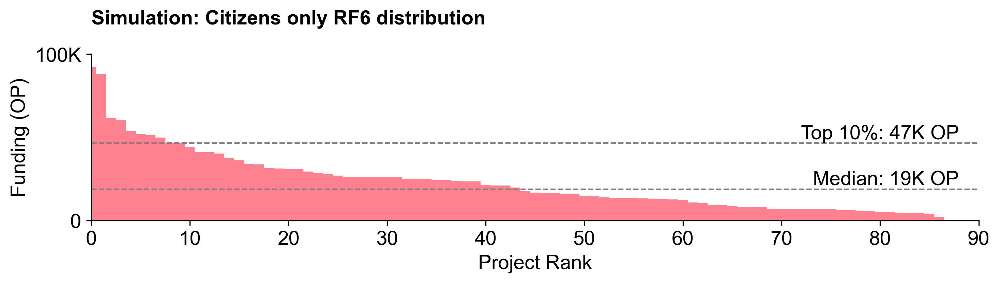

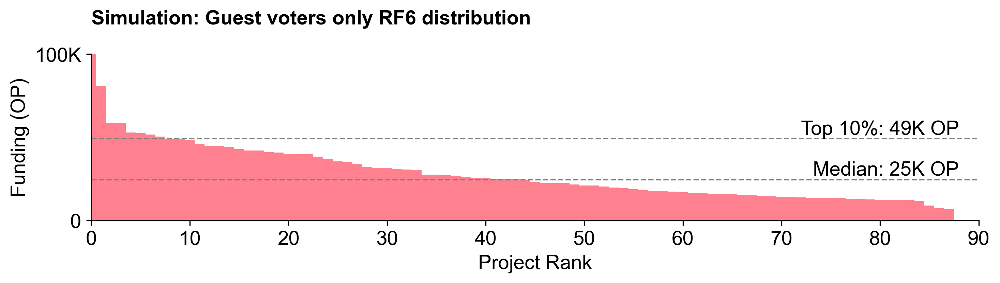

In [13]:
citizens_distribution = simulate_scorer(voting_data, df_voters[df_voters['is_citizen']].index)
f1 = distributions_barchart(
    citizens_distribution['rewards'],
    "Simulation: Citizens only RF6 distribution",
    ymax=100,
    xstep=10
)

guests_distribution = simulate_scorer(voting_data, df_voters[~df_voters['is_citizen']].index)
f2 = distributions_barchart(
    guests_distribution['rewards'],
    "Simulation: Guest voters only RF6 distribution",
    ymax=100,
    xstep=10
)

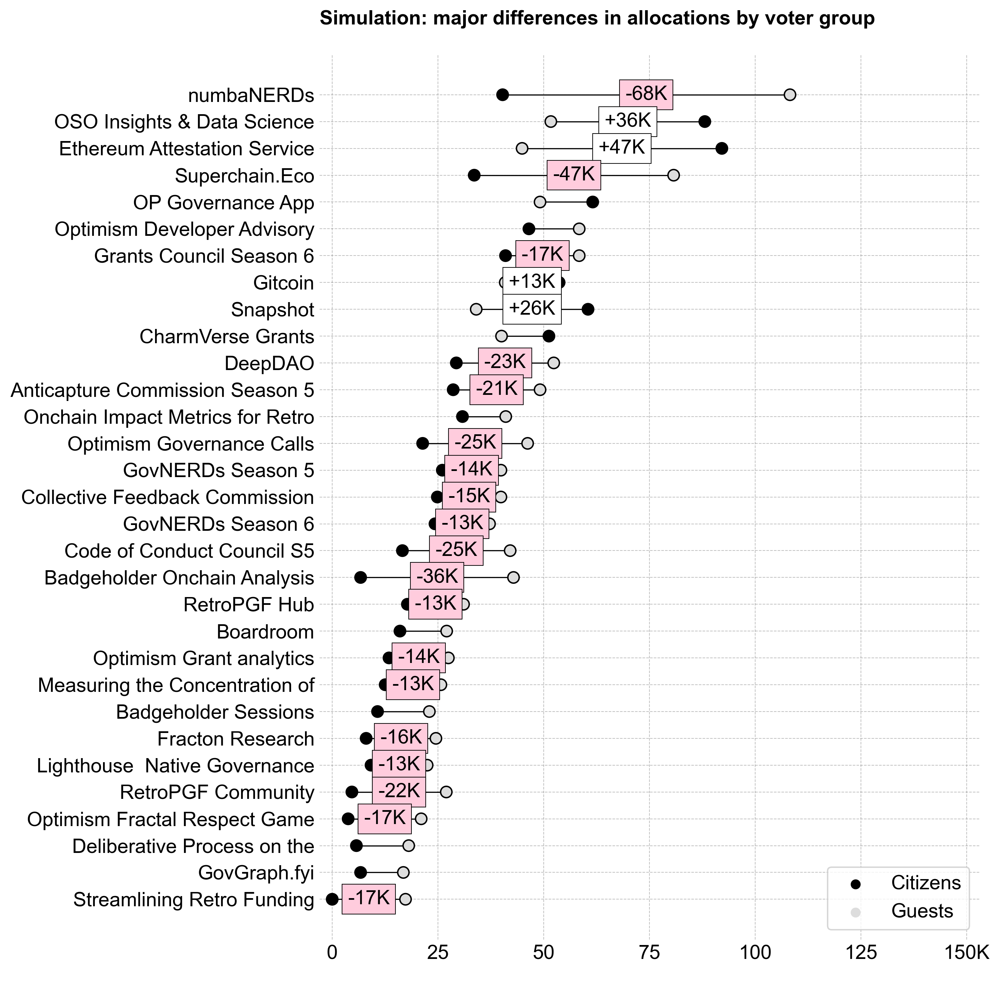

In [14]:
dist_compare = pd.concat([
    citizens_distribution,
    guests_distribution
], axis=1)
dist_compare.columns = ['Citizens', 'Guests']
deltas = abs(dist_compare['Citizens'] - dist_compare['Guests'])
high_deltas = deltas>=10000
dist_compare = dist_compare[high_deltas]

dist_compare.reset_index(inplace=True)
dist_compare = dist_compare.melt(
    id_vars='project_id',
    value_vars=['Citizens', 'Guests'],
    var_name='voter_type',
    value_name='project_amount'
).set_index('project_id').join(df_projects)

plot_medians_by_voter_group(
    dist_compare,
    xcol='project_amount',
    xmax=150,
    xstep=25,
    subtitle='Simulation: major differences in allocations by voter group',
    group_col='voter_type'
)    

Text(0.0, 1.0, "Standard deviation in how much a 'divisive' project should recieve\n")

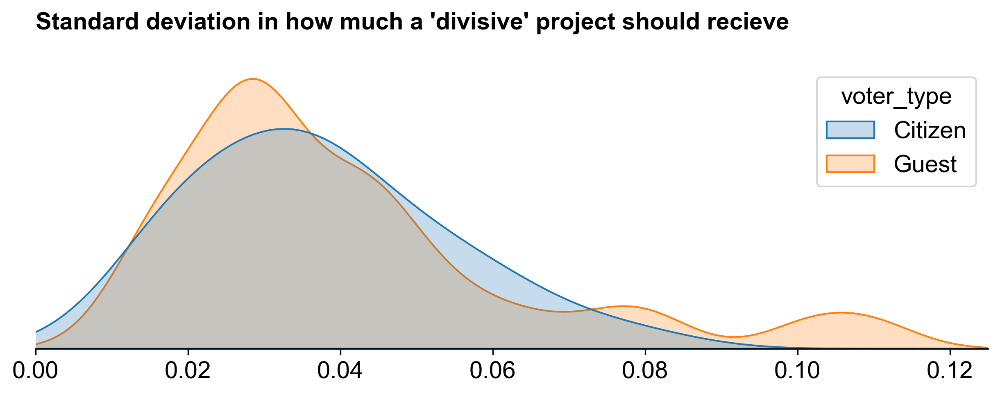

In [15]:
divisive_list = dist_compare.index.unique()
fig, ax = plt.subplots(figsize=(10, 3), dpi=300)
sns.kdeplot(
    data=(
        df[df.project_id.isin(divisive_list)]
        .groupby(['project_name', 'voter_type'])
        ['project_percentage']
        .std().reset_index()
    ),
    x='project_percentage',
    hue='voter_type',
    fill=True,
    common_norm=False,
    bw_adjust=0.5,
    ax=ax
)
format_axis(ax, xmin=0, xmax=.125, xpost='%')
ax.set_ylabel("")
ax.set_xlabel("")
ax.spines['left'].set_visible(False)
ax.set_yticks([])
ax.set_title(f"Standard deviation in how much a 'divisive' project should recieve\n", loc='left', weight='bold')

Text(0.0, 1.0, 'Variance in project allocations by voting group\n')

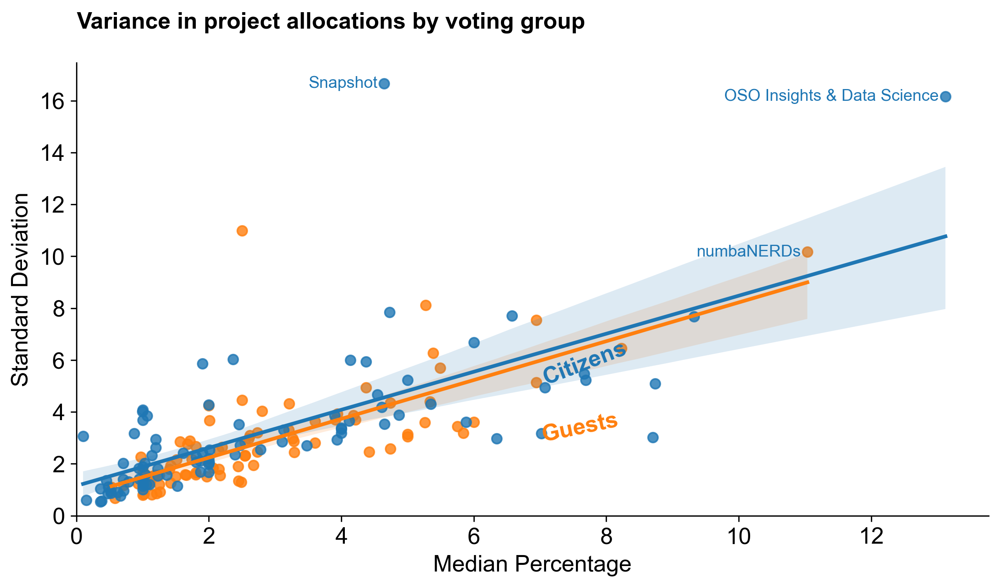

In [16]:
#sns.scatterplot()

medians_by_group = df.groupby(['voter_type', 'project_id'])['project_percentage'].median().rename('median')
stdevs_by_group = df.groupby(['voter_type', 'project_id'])['project_percentage'].std().rename('std')
df_var = pd.concat([
    medians_by_group * 100,
    stdevs_by_group * 100
], axis=1).reset_index()

fig, ax = plt.subplots(figsize=(10, 5), dpi=300)

sns.regplot(
    data=df_var[df_var.voter_type!='Citizen'],
    x='median',
    y='std',
    color='#ff7f0e',
    ax=ax
)
sns.regplot(
    data=df_var[df_var.voter_type=='Citizen'],
    x='median',
    y='std',
    color='#1f77b4',
    ax=ax
)

format_axis(ax, xmin=0)
ax.set_xlabel('Median Percentage')
ax.set_ylabel('Standard Deviation')
ax.set_ylim(0,)
ax.text(x=7,y=5.05,s='Citizens', color='#1f77b4', weight='bold', rotation=21)
ax.text(x=7,y=2.85,s='Guests', color='#ff7f0e', weight='bold', rotation=11.7)

examples = df_var.set_index('project_id').join(df_projects).sort_values(by='std').iloc[[-1,-2,-4]]
for _, p in examples.iterrows():
    ax.text(x=p['median']-.1, y=p['std'], s=p['project_display_name'], color='#1f77b4', fontsize=10, ha='right', va='center')

ax.set_title("Variance in project allocations by voting group\n", loc='left', weight='bold')




# Part 4. Category deep dives

In [17]:
category_votes = []
categories = set()
for ballot in voting_data:
    cat = ballot['category_assignment']
    categories.add(cat)
    b = {
        'voter_address': ballot['voter_address'],
        'category_assignment': cat
    }
    for category_alloc in ballot['category_allocations']:
        b.update(category_alloc)
    category_votes.append(b)

df_category_votes = pd.DataFrame(category_votes)
for category in categories:
    df_category_votes[category] = pd.to_numeric(df_category_votes[category])

In [18]:
categories = list(df_projects['category'].unique())

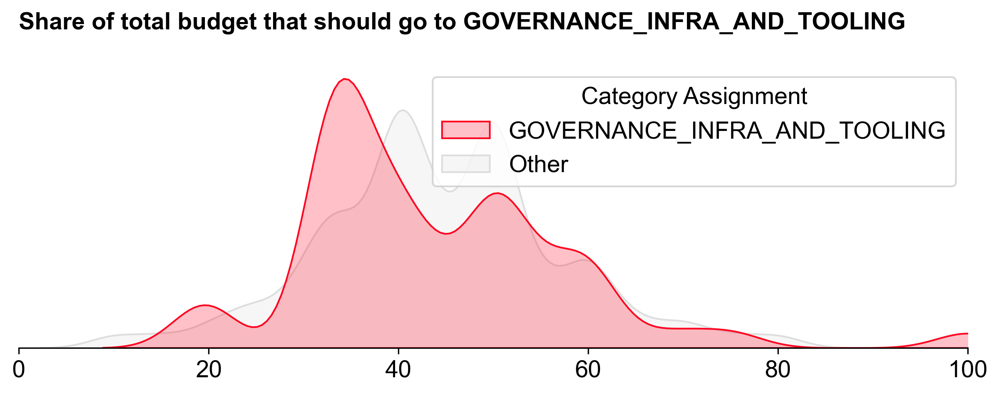

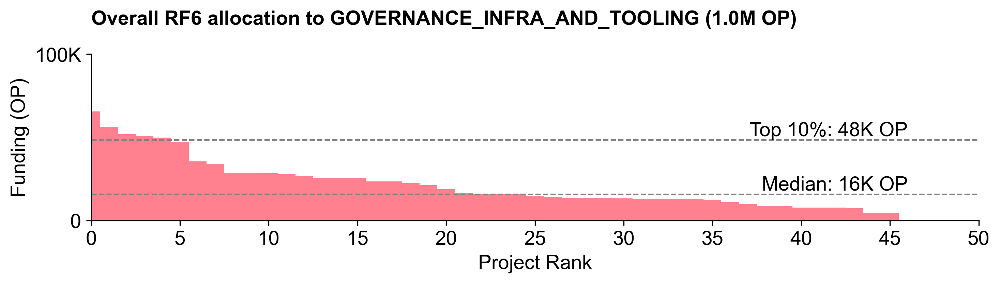

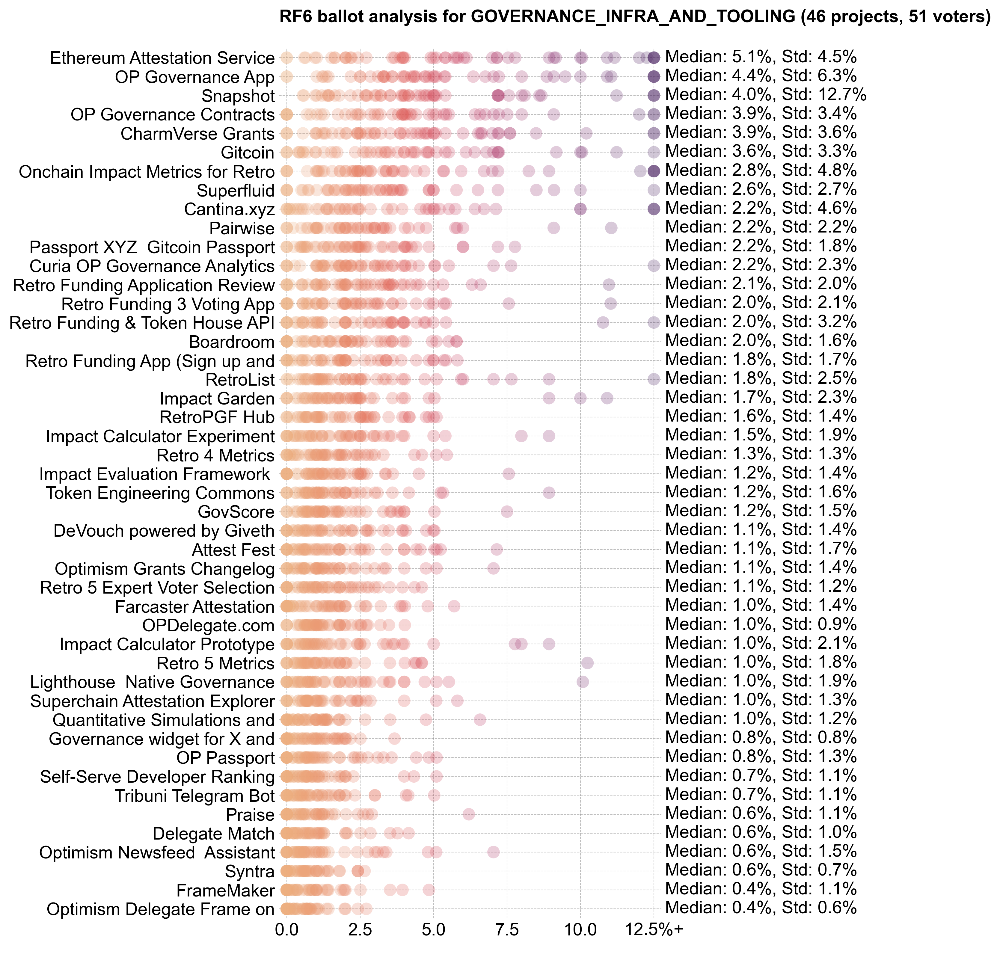

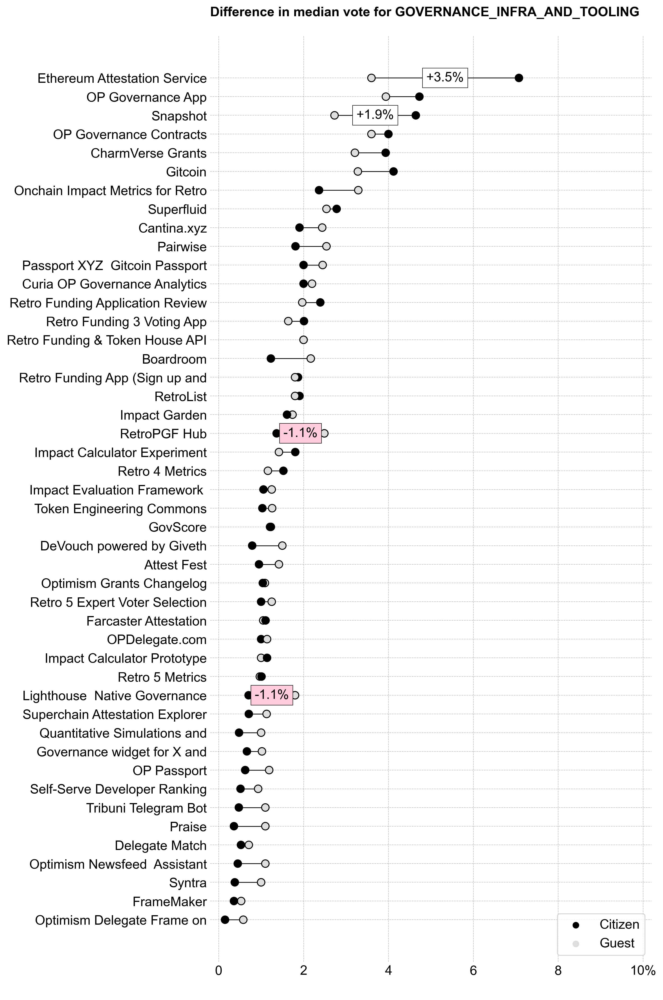

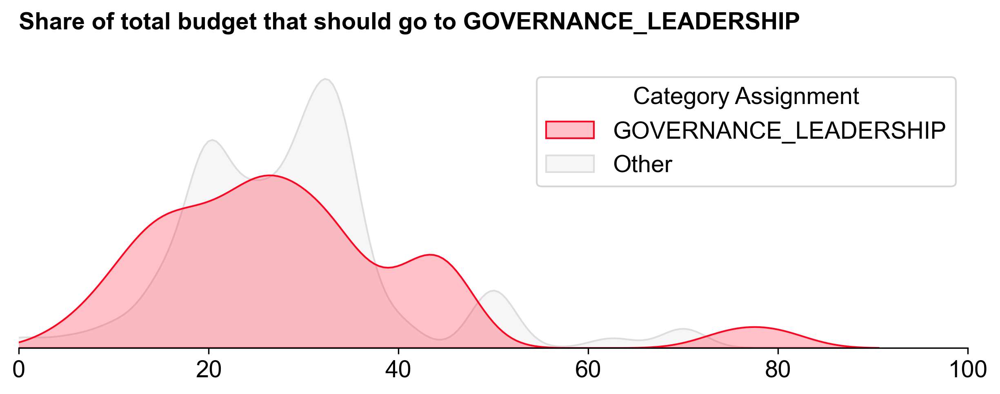

...

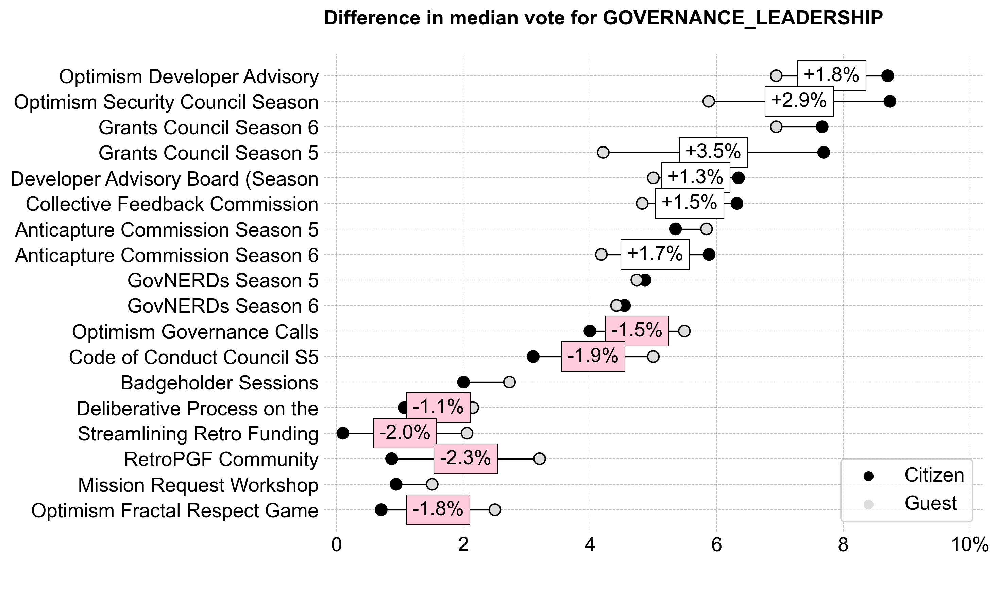

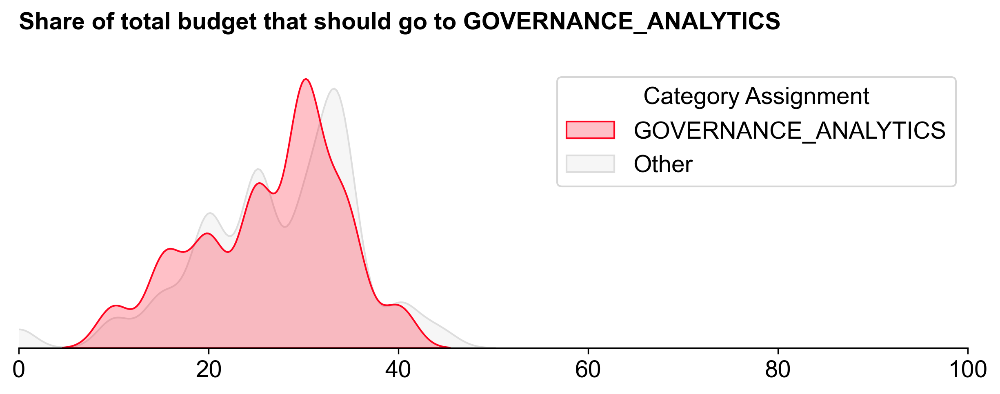

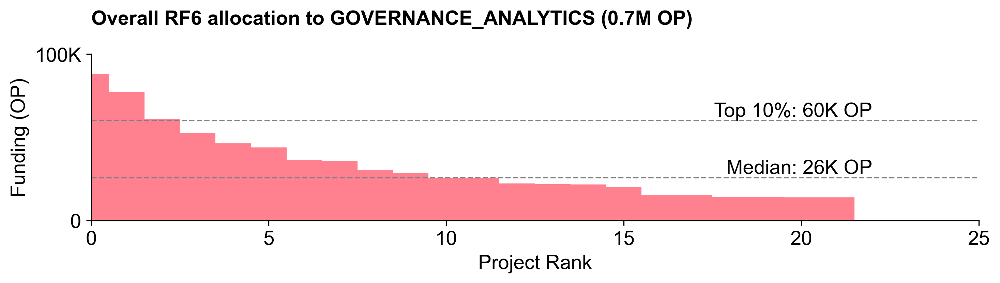

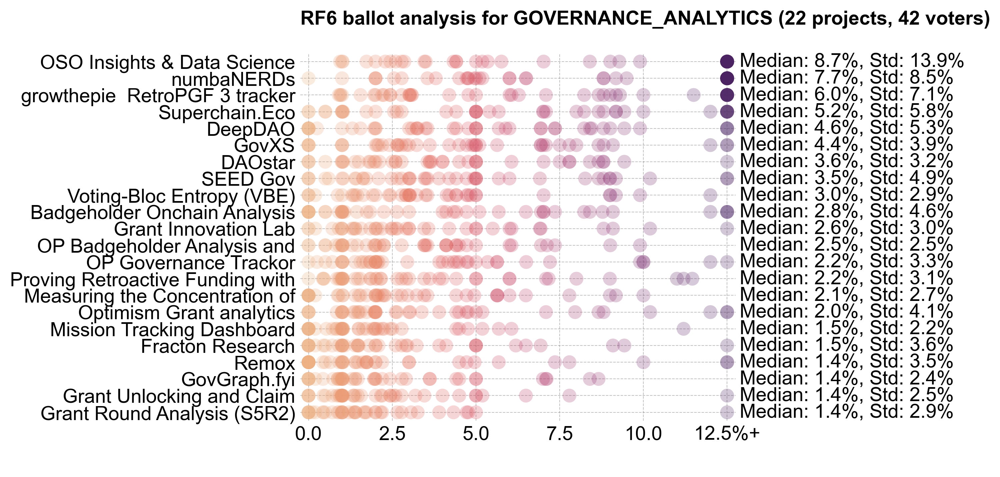

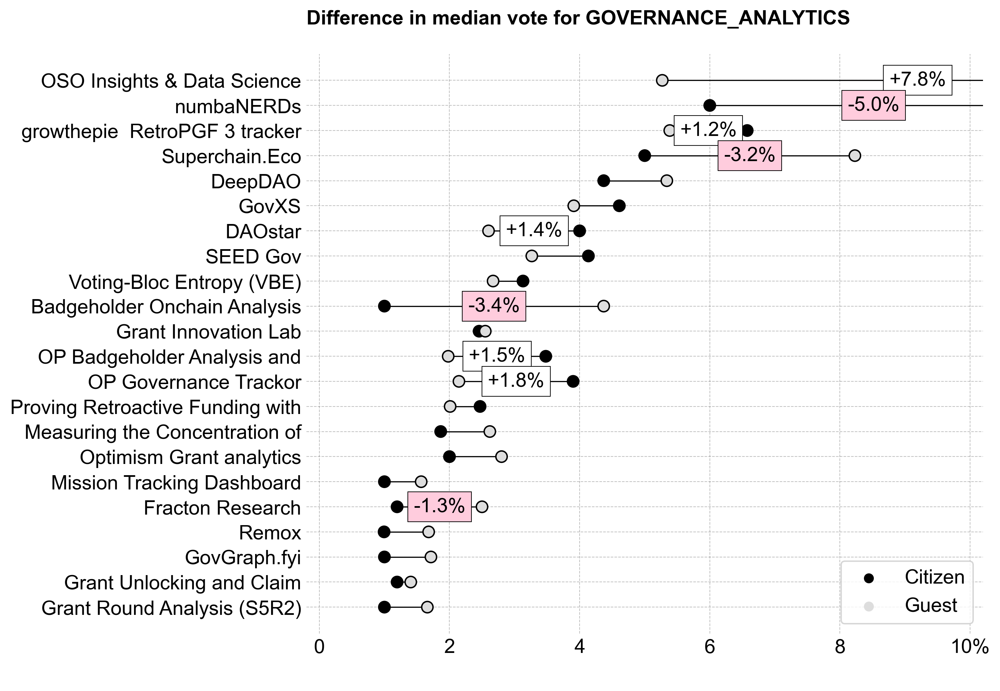

In [19]:
for category in categories:

    f_cat = category_kde_plots(df_category_votes, category)

    category_results = r6_data[r6_data.index.isin(df_projects[df_projects['category'] == category].index)]

    f_dist = distributions_barchart(
        category_results,
        title=f"Overall RF6 allocation to {category} ({category_results.sum()/1_000_000:.1f}M OP)",
        ymax=100
    )

    f_ballot = plot_ballots_by_project_category(
        df[df.category == category],
        xcol='project_percentage',
        subtitle=f"RF6 ballot analysis for {category}"
    )

    f_experts = plot_medians_by_voter_group(
        df[df.category == category],
        xcol='project_percentage',
        subtitle=f"Difference in median vote for {category}",
        group_col='voter_type'
    )    